# 0. Reading the data

In [1]:
import pandas as pd

In [2]:
# Mounting Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Specifying location of the data
import os
os.chdir("/content/drive/MyDrive/Leaf_Wetness_Prediction_data")

In [4]:
# Read the data to the dataframes
df_datasources = pd.read_csv("datasources_p.csv")
df_series = pd.read_csv("series_p.csv")

In [5]:
df_seriesdata = pd.read_csv("seriesdata_p.csv", low_memory = False)

# 1.1. Data Sources understanding

In [6]:
df_datasources.head(5)

,datasourcetype_id,dataprovider_id,datasource_id,datasource_name,datasource_externalid,datasource_metadata,pob_station,dataprovider_name,datasourcetype_name,longitude,latitude
0,1,4,28,Iscarção,643,"{""Timezone"": ""Europe/Lisbon"", ""Daylight offset...",True,WiseCrop,Weather Station,"-9,03668","39,26951"
1,1,4,29,Vale da Fonte,697,"{""Timezone"": ""Europe/Lisbon"", ""Daylight offset...",True,WiseCrop,Weather Station,"-9,206385","39,274678"
2,1,4,31,Qta do Brejo,642,"{""Timezone"": ""Europe/Lisbon"", ""Daylight offset...",True,WiseCrop,Weather Station,"-9,064003","39,249927"
3,1,4,8,Quinta do Rato,717,"{""Timezone"": ""Europe/Lisbon"", ""Daylight offset...",True,WiseCrop,Weather Station,"-9,119531","39,478397"
4,1,1,16,COTHN,000004BB,"{""Timezone"": ""Europe/Lisbon"", ""Daylight offset...",False,PESSL,Weather Station,"-9,01499","39,28281"


Column 'datasource_metadata' contains dictionary-like data which can be break down to three separete columns:

In [7]:
# Convert column to dictionary
df_datasources['datasource_metadata'] = df_datasources['datasource_metadata'].apply(lambda x: eval(x))
# Create dataframe from the column and join to the initial dataframe
df_datasources = df_datasources.join(pd.DataFrame(df_datasources['datasource_metadata'].to_list()))
# Drop the old column
df_datasources = df_datasources.drop('datasource_metadata', axis=1)
# Rename columns
df_datasources = df_datasources.rename(columns={'Daylight offset': 'daylight_offset', 'Standard offset': 'standart_offset', 'Timezone': 'timezone'})

In [8]:
df_datasources.head(5)

,datasourcetype_id,dataprovider_id,datasource_id,datasource_name,datasource_externalid,pob_station,dataprovider_name,datasourcetype_name,longitude,latitude,timezone,daylight_offset,standart_offset
0,1,4,28,Iscarção,643,True,WiseCrop,Weather Station,"-9,03668","39,26951",Europe/Lisbon,1,0
1,1,4,29,Vale da Fonte,697,True,WiseCrop,Weather Station,"-9,206385","39,274678",Europe/Lisbon,1,0
2,1,4,31,Qta do Brejo,642,True,WiseCrop,Weather Station,"-9,064003","39,249927",Europe/Lisbon,1,0
3,1,4,8,Quinta do Rato,717,True,WiseCrop,Weather Station,"-9,119531","39,478397",Europe/Lisbon,1,0
4,1,1,16,COTHN,000004BB,False,PESSL,Weather Station,"-9,01499","39,28281",Europe/Lisbon,0,0


In [9]:
# Display the dataframe's info
df_datasources.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   datasourcetype_id      33 non-null     int64 
 1   dataprovider_id        33 non-null     int64 
 2   datasource_id          33 non-null     int64 
 3   datasource_name        33 non-null     object
 4   datasource_externalid  33 non-null     object
 5   pob_station            33 non-null     bool  
 6   dataprovider_name      33 non-null     object
 7   datasourcetype_name    33 non-null     object
 8   longitude              33 non-null     object
 9   latitude               33 non-null     object
 10  timezone               33 non-null     object
 11  daylight_offset        33 non-null     int64 
 12  standart_offset        33 non-null     int64 
dtypes: bool(1), int64(5), object(7)
memory usage: 3.3+ KB


The data frame doesn't have null values.

Latitude and longitude should be converted to float dtype.

In [10]:
# Count unique values in each column
df_datasources.apply(lambda x: len(x.unique()))

datasourcetype_id         1
dataprovider_id           4
datasource_id            33
datasource_name          33
datasource_externalid    33
pob_station               2
dataprovider_name         4
datasourcetype_name       1
longitude                33
latitude                 33
timezone                  1
daylight_offset           3
standart_offset           1
dtype: int64

We see that datasource_id, datasource_name and datasource_externalid are unique identifiers of the datasource.

All datasources share the same values of parameters: datasourcetype_id,
datasourcetype_name, timezone, standart_offset. Let's show the values of
these parameters and delete them from the data frame.

In [11]:
# Show values of datasourcetype_id, datasourcetype_name, timezone, standart_offset
df_datasources[['datasourcetype_id', 'datasourcetype_name', 'timezone', 'standart_offset']].iloc[0]

datasourcetype_id                    1
datasourcetype_name    Weather Station
timezone                 Europe/Lisbon
standart_offset                      0
Name: 0, dtype: object

In [12]:
# Drop datasourcetype_id, datasourcetype_name, timezone, standart_offset from the dataframe
df_datasources.drop(['datasourcetype_id', 'datasourcetype_name', 'timezone', 'standart_offset'], axis=1,inplace=True)

All data sources we have are weather statoins in Lisbon timezone with standart offset = 0

Let's convers latitude and longitude to the float dtype:

In [13]:
# Replace commas with periods
df_datasources.latitude = df_datasources.latitude.str.replace(',', '.')
df_datasources.longitude = df_datasources.longitude.str.replace(',', '.')
# Convert the string column to float
df_datasources.latitude = df_datasources.latitude.astype(float)
df_datasources.longitude = df_datasources.longitude.astype(float)

To look into destribution of stations among the parameters 'dataprovider_name','pob_station', 'daylight_offset', let's define a function which groupes data frame according to specified column, aggregate it by size() function amd plot a horizontal bar chart

In [14]:
import plotly.express as px
# Define a function to plot a hbar chart
def plot_barh(df, column_name):
  grouped = df.groupby(column_name).size()
  fig = px.bar(y=grouped.index, x=grouped.values, orientation='h', text_auto=True)
  fig.update_layout(title='Count of Categories by ' + column_name,
                    xaxis_title='Count',
                    yaxis_title=column_name)
  fig.show()

In [15]:
# plot graphs
for column_name in ['dataprovider_name','pob_station', 'daylight_offset']:
  plot_barh(df_datasources, column_name)

To see geographical destribution of stations let's define a function which show our station on the map according to their latitude and londitude and color them according to selected property.

In [16]:
# Define the function to plot a map
import plotly.express as px

def plot_map(df, column_name):
  fig = px.scatter_mapbox(df,
                          lat="latitude",
                          lon="longitude",
                          hover_name="datasource_name",
                          hover_data=["pob_station", "dataprovider_name", "daylight_offset"],
                          color = df[column_name],
                          zoom=7.5,
                          height=350)
  fig.update_layout(mapbox_style="open-street-map")
  fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
  fig.show()



In [17]:
# Plot maps
for column_name in ['dataprovider_name', 'pob_station', 'daylight_offset']:
  plot_map(df_datasources, column_name)
  print()

# 1.2. Series Understanding


In [18]:
df_series.head(5)

,seriesvariable_id,seriestype_id,series_id,datasource_id,seriestype_name,datatype_id,seriesperiod_id,calculationmethod_id,unit_symbol,seriesvariable_label,seriesvariable_longname,seriesvariable_standardname,seriesvariable_description
0,167,1,2105,16,Raw Series,37,3,1,°C,MEDPNTDP30M,Mean Dew Point Depression (30m),mean(dew_point_depression PT30M),Mean dew point depression in the last 30 minutes
1,60,1,205,16,Raw Series,2,7,3,°C,MXSOILTEMP3M,Maximum Soil Temperature (3m),max(soil_temperature PT3M),Maximum soil temperature in the last 3 minutes
2,21,1,475,6,Raw Series,6,4,5,min,ACCLFWET15M,Leaf Wetness Time (15m),accumulated(leaf_wetness PT15M),Accumulated time of leaf wetness in the last 1...
3,33,1,487,8,Raw Series,4,4,3,m/s,MXWNDSPD15M,Maximum Wind Speed (15m),max(wind_speed PT15M),Maximum wind speed in the last 15 minutes
4,81,1,489,8,Raw Series,7,4,1,kPa,MEVPD15M,Mean VPD (15m),mean(water_vapor_saturation_deficit PT15M),Mean VPD in the last 15 minutes


We can break down the column 'seriesvariable_standartname' to three separate columns: 'calculation_method', 'variable' and 'period':

In [19]:
# Some specific replacements to uniform the data
df_series['seriesvariable_standardname'] = df_series['seriesvariable_standardname'].str.replace('max(max(','max(', regex = False)
df_series['seriesvariable_standardname'] = df_series['seriesvariable_standardname'].str.replace('max_wind_speed(','max(', regex = False)
df_series['seriesvariable_standardname'] = df_series['seriesvariable_standardname'].str.replace('PT15m','PT15M', regex = False)

# Breack seriesveriable_standartname to three columns: calculation_method, datatype, period
df_series['seriesvariable_standardname'] = df_series['seriesvariable_standardname'].str.replace('(',' ', regex = False).str.replace(')', '', regex = False)
df_series[['calculation_method', 'variable', 'period']] = df_series['seriesvariable_standardname'].str.split(' ', n = 2, expand = True)

# Drop seriesvariable_longname column
df_series = df_series.drop('seriesvariable_longname', axis=1)

In [20]:
df_series.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 667 entries, 0 to 666
Data columns (total 15 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   seriesvariable_id            667 non-null    int64 
 1   seriestype_id                667 non-null    int64 
 2   series_id                    667 non-null    int64 
 3   datasource_id                667 non-null    int64 
 4   seriestype_name              667 non-null    object
 5   datatype_id                  667 non-null    int64 
 6   seriesperiod_id              667 non-null    int64 
 7   calculationmethod_id         667 non-null    int64 
 8   unit_symbol                  667 non-null    object
 9   seriesvariable_label         667 non-null    object
 10  seriesvariable_standardname  667 non-null    object
 11  seriesvariable_description   610 non-null    object
 12  calculation_method           667 non-null    object
 13  variable                     667 no

In [21]:
# Count unique values in each column
df_series.apply(lambda x: len(x.unique()))

seriesvariable_id               74
seriestype_id                    1
series_id                      667
datasource_id                   59
seriestype_name                  1
datatype_id                     13
seriesperiod_id                  5
calculationmethod_id             5
unit_symbol                      9
seriesvariable_label            73
seriesvariable_standardname     73
seriesvariable_description      72
calculation_method               5
variable                        13
period                           5
dtype: int64

In [22]:
# Show number of series grouped by calculation method
df_series.groupby(['variable','calculation_method']).size()

variable                        calculation_method
air_temperature                 max                   45
                                mean                  61
                                min                   45
dew_point_depression            mean                  40
dew_point_temperature           mean                  42
                                min                   12
leaf_wetness                    accumulated           34
precipitation_amount            sum                   42
reference_evapotranspiration    mean                   9
relative_humidity               max                    4
                                mean                  61
                                min                    4
soil_temperature                max                    3
                                mean                   3
                                min                    3
solar_irradiance                max                   14
                                mean 

<Axes: ylabel='variable,unit_symbol'>

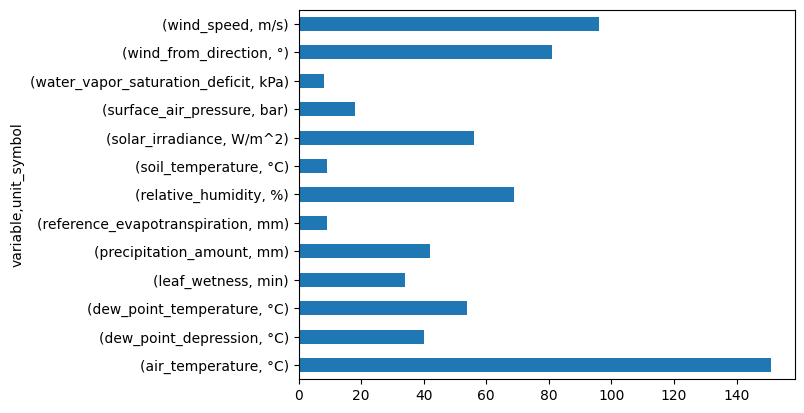

In [23]:
df_series.groupby(['variable','unit_symbol']).size().plot(kind='barh')
# Units are the same for the same type of measurments

In [24]:
# Change period value to timeinterval dtype (in minutes)
df_series['period'] = df_series['period'].str.replace('PT15M','15 minutes', regex = False).str.replace('PT3M','3 minutes', regex = False).str.replace('PT30M','30 minutes', regex = False).str.replace('PT1H','1 hour', regex = False).str.replace('PT1D','1 day', regex = False)
df_series['period'] = pd.to_timedelta(df_series['period'])

In [25]:
# Drop columns that doesn't give any useful information:
df_series.drop(['seriesvariable_description',
                'calculationmethod_id',
                'seriesperiod_id',
                'seriestype_name',
                'seriestype_id',
                'seriesvariable_label',
                'datatype_id',
                'seriesvariable_id'],axis=1,inplace=True)

In [26]:
df_series

,series_id,datasource_id,unit_symbol,seriesvariable_standardname,calculation_method,variable,period
0,2105,16,°C,mean dew_point_depression PT30M,mean,dew_point_depression,0 days 00:30:00
1,205,16,°C,max soil_temperature PT3M,max,soil_temperature,0 days 00:03:00
2,475,6,min,accumulated leaf_wetness PT15M,accumulated,leaf_wetness,0 days 00:15:00
3,487,8,m/s,max wind_speed PT15M,max,wind_speed,0 days 00:15:00
4,489,8,kPa,mean water_vapor_saturation_deficit PT15M,mean,water_vapor_saturation_deficit,0 days 00:15:00
...,...,...,...,...,...,...,...
662,2136,22,°C,mean dew_point_depression PT15M,mean,dew_point_depression,0 days 00:15:00
663,2137,11,°C,mean dew_point_depression PT15M,mean,dew_point_depression,0 days 00:15:00
664,2138,12,°C,mean dew_point_depression PT15M,mean,dew_point_depression,0 days 00:15:00
665,2139,36,°C,mean dew_point_depression PT1H,mean,dew_point_depression,0 days 01:00:00


In [27]:
# Unite series and datasources info together
df_series_and_sources = pd.merge(df_series, df_datasources, on='datasource_id')

In [28]:
df_series_and_sources

,series_id,datasource_id,unit_symbol,seriesvariable_standardname,calculation_method,variable,period,dataprovider_id,datasource_name,datasource_externalid,pob_station,dataprovider_name,longitude,latitude,daylight_offset
0,2105,16,°C,mean dew_point_depression PT30M,mean,dew_point_depression,0 days 00:30:00,1,COTHN,000004BB,False,PESSL,-9.01499,39.28281,0
1,205,16,°C,max soil_temperature PT3M,max,soil_temperature,0 days 00:03:00,1,COTHN,000004BB,False,PESSL,-9.01499,39.28281,0
2,175,16,°C,mean air_temperature PT30M,mean,air_temperature,0 days 00:30:00,1,COTHN,000004BB,False,PESSL,-9.01499,39.28281,0
3,177,16,°C,mean air_temperature PT3M,mean,air_temperature,0 days 00:03:00,1,COTHN,000004BB,False,PESSL,-9.01499,39.28281,0
4,178,16,°C,max air_temperature PT30M,max,air_temperature,0 days 00:30:00,1,COTHN,000004BB,False,PESSL,-9.01499,39.28281,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
469,555,34,%,mean relative_humidity PT30M,mean,relative_humidity,0 days 00:30:00,5,Silveira,9001,False,TerraPro,-9.33460,39.09316,-1
470,556,34,°,mean wind_from_direction PT30M,mean,wind_from_direction,0 days 00:30:00,5,Silveira,9001,False,TerraPro,-9.33460,39.09316,-1
471,557,34,min,accumulated leaf_wetness PT30M,accumulated,leaf_wetness,0 days 00:30:00,5,Silveira,9001,False,TerraPro,-9.33460,39.09316,-1
472,558,34,°C,mean dew_point_temperature PT30M,mean,dew_point_temperature,0 days 00:30:00,5,Silveira,9001,False,TerraPro,-9.33460,39.09316,-1


# Series Data Understanding


In [29]:
df_seriesdata

,datasource_externalid,series_id,datatype_id,seriesdata_timestamp,seriesdata_realvalue,Real Value
0,Coopval03VN,41,18,29/11/2020 00:00:00,NaN,NaN
1,Coopval03VN,41,18,12/01/2021 17:45:00,NaN,NaN
2,Coopval03VN,41,18,12/01/2021 18:00:00,NaN,NaN
3,Coopval03VN,41,18,28/11/2020 20:30:00,NaN,NaN
4,Coopval03VN,41,18,28/11/2020 20:45:00,NaN,NaN
...,...,...,...,...,...,...
9873960,CABValeC,129,1,14/10/2020 20:00:00,12.2,12.2
9873961,CABValeC,129,1,15/10/2020 20:00:00,12.2,12.2
9873962,CABValeC,129,1,16/10/2020 18:45:00,12.2,12.2
9873963,CABValeC,129,1,17/10/2020 20:30:00,12.2,12.2


In [30]:
df_seriesdata = df_seriesdata.rename(columns={'Real Value': 'value'}) # Rename columns
df_seriesdata.drop('seriesdata_realvalue',axis=1,inplace=True) # realvalue just copies the value column

In [31]:
df_seriesdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9873965 entries, 0 to 9873964
Data columns (total 5 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   datasource_externalid  object 
 1   series_id              int64  
 2   datatype_id            int64  
 3   seriesdata_timestamp   object 
 4   value                  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 376.7+ MB


In [32]:
# Show number of unique values in each column
df_seriesdata.apply(lambda x: len(x.unique()))

datasource_externalid       11
series_id                  145
datatype_id                 13
seriesdata_timestamp     70332
value                    68400
dtype: int64

In [33]:
# Show number of null values in each column
df_seriesdata.apply(lambda x: x.isnull().sum())

datasource_externalid         0
series_id                     0
datatype_id                   0
seriesdata_timestamp          0
value                    629669
dtype: int64

In [34]:
# Show number of missed values by series id
df_seriesdata.groupby('series_id')['value'].apply(lambda x: x.isnull().sum()).describe()
# There is no series without missing values, average number of missing values is 4342

count      145.000000
mean      4342.544828
std       4918.178516
min        974.000000
25%       1801.000000
50%       2421.000000
75%       4033.000000
max      26130.000000
Name: value, dtype: float64

# II. Merge all the data together



In [35]:
# Merge all together
df_data = pd.merge(df_seriesdata, df_series_and_sources, on='series_id')

In [36]:
df_data

,datasource_externalid_x,series_id,datatype_id,seriesdata_timestamp,value,datasource_id,unit_symbol,seriesvariable_standardname,calculation_method,variable,period,dataprovider_id,datasource_name,datasource_externalid_y,pob_station,dataprovider_name,longitude,latitude,daylight_offset
0,Coopval03VN,41,18,29/11/2020 00:00:00,NaN,3,bar,mean surface_air_pressure PT15M,mean,surface_air_pressure,0 days 00:15:00,2,Coopval03VN,Coopval03VN,False,APAS,-9.094394,39.203011,1
1,Coopval03VN,41,18,12/01/2021 17:45:00,NaN,3,bar,mean surface_air_pressure PT15M,mean,surface_air_pressure,0 days 00:15:00,2,Coopval03VN,Coopval03VN,False,APAS,-9.094394,39.203011,1
2,Coopval03VN,41,18,12/01/2021 18:00:00,NaN,3,bar,mean surface_air_pressure PT15M,mean,surface_air_pressure,0 days 00:15:00,2,Coopval03VN,Coopval03VN,False,APAS,-9.094394,39.203011,1
3,Coopval03VN,41,18,28/11/2020 20:30:00,NaN,3,bar,mean surface_air_pressure PT15M,mean,surface_air_pressure,0 days 00:15:00,2,Coopval03VN,Coopval03VN,False,APAS,-9.094394,39.203011,1
4,Coopval03VN,41,18,28/11/2020 20:45:00,NaN,3,bar,mean surface_air_pressure PT15M,mean,surface_air_pressure,0 days 00:15:00,2,Coopval03VN,Coopval03VN,False,APAS,-9.094394,39.203011,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9873960,CABValeC,140,9,04/08/2021 06:15:00,77.0,13,W/m^2,max solar_irradiance PT15M,max,solar_irradiance,0 days 00:15:00,2,CABValeC,CABValeC,False,APAS,-9.176588,39.244676,1
9873961,CABValeC,140,9,24/08/2021 07:45:00,77.0,13,W/m^2,max solar_irradiance PT15M,max,solar_irradiance,0 days 00:15:00,2,CABValeC,CABValeC,False,APAS,-9.176588,39.244676,1
9873962,CABValeC,140,9,01/09/2021 18:00:00,77.0,13,W/m^2,max solar_irradiance PT15M,max,solar_irradiance,0 days 00:15:00,2,CABValeC,CABValeC,False,APAS,-9.176588,39.244676,1
9873963,CABValeC,140,9,23/10/2021 17:15:00,77.0,13,W/m^2,max solar_irradiance PT15M,max,solar_irradiance,0 days 00:15:00,2,CABValeC,CABValeC,False,APAS,-9.176588,39.244676,1


In [37]:
df_data.apply(lambda x: x.isnull().sum())

datasource_externalid_x             0
series_id                           0
datatype_id                         0
seriesdata_timestamp                0
value                          629669
datasource_id                       0
unit_symbol                         0
seriesvariable_standardname         0
calculation_method                  0
variable                            0
period                              0
dataprovider_id                     0
datasource_name                     0
datasource_externalid_y             0
pob_station                         0
dataprovider_name                   0
longitude                           0
latitude                            0
daylight_offset                     0
dtype: int64

In [38]:
#Analysis of missing values by variable and calculation method
df_data.groupby(['variable', 'calculation_method'])['value'].apply(lambda x: x.isnull().sum())

variable                        calculation_method
air_temperature                 max                    15789
                                mean                   35176
                                min                    15789
dew_point_depression            mean                   45097
dew_point_temperature           mean                   42470
                                min                     4033
leaf_wetness                    accumulated            38513
precipitation_amount            sum                    30546
reference_evapotranspiration    mean                    9525
relative_humidity               mean                   35161
soil_temperature                max                     3389
                                mean                    3389
                                min                     3389
solar_irradiance                max                    11778
                                mean                   31061
surface_air_pressure            me

In [39]:
# Analysis of missing values by stations
df_data.groupby(['datasource_id'])['value'].apply(lambda x: x.isnull().sum())

datasource_id
1     38765
2     45538
3     59465
9     47792
13    76026
14    76766
15    49146
16    57465
28    91378
29    27223
30    60105
Name: value, dtype: int64

In [40]:
len(df_data)

9873965

In [41]:
# Drop duplicates
df_data.drop_duplicates(subset=['series_id','seriesdata_timestamp'], inplace=True)

In [42]:
len(df_data)

9872809

In [43]:
df_data.apply(lambda x: len(x.unique()))

datasource_externalid_x           11
series_id                        145
datatype_id                       13
seriesdata_timestamp           70332
value                          68400
datasource_id                     11
unit_symbol                        9
seriesvariable_standardname       21
calculation_method                 5
variable                          13
period                             1
dataprovider_id                    3
datasource_name                   11
datasource_externalid_y           11
pob_station                        2
dataprovider_name                  3
longitude                         11
latitude                          11
daylight_offset                    2
dtype: int64

In [44]:
# Check if we have several series for one mesurment from one station - NO
df_data.groupby(['datasource_id','variable','calculation_method'])['series_id'].apply(lambda x: len(x.unique())).describe()

count    145.0
mean       1.0
std        0.0
min        1.0
25%        1.0
50%        1.0
75%        1.0
max        1.0
Name: series_id, dtype: float64

<Axes: xlabel='datasource_id'>

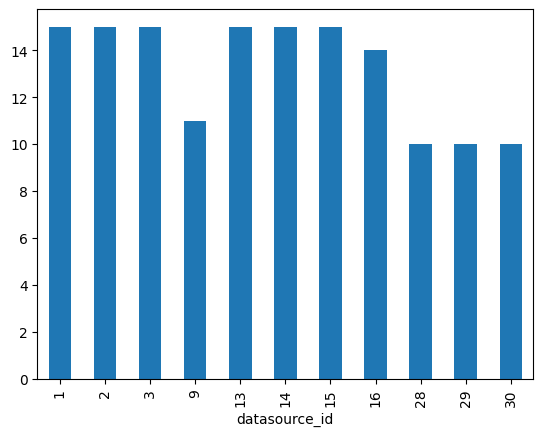

In [45]:
# Check how many series we have for different stations, for all station we have from 10 to 15 series
df_data.groupby('datasource_id')['series_id'].apply(lambda x: len(x.unique())).plot(kind="bar")

In [46]:
# Plot stations stations from which we have after merging all data and visualize by datasource provider
plot_map(df_data[['latitude','longitude','dataprovider_name','datasource_name','datasource_id','pob_station','daylight_offset']].drop_duplicates(), 'dataprovider_name')

In [47]:
# Vizualise by parameter pob_staton
plot_map(df_data[['latitude','longitude','dataprovider_name','datasource_name','datasource_id','pob_station','daylight_offset']].drop_duplicates(), 'pob_station')

In [48]:
# Define a function to plot series by given variable, calculation method and weather station
def plot_series(df, variable, calculation_method, station, time_interval='all'):
  condition1 = df['variable'] == variable
  condition2 = df['calculation_method'] == calculation_method
  condition3 = df['datasource_id'] == station
  df = df.loc[condition1 & condition2 & condition3]
  df['seriesdata_timestamp'] = pd.to_datetime(df['seriesdata_timestamp'])
  df = df.set_index(df['seriesdata_timestamp'])
  df = df.sort_index()
  fig = px.line(df, x = df.index, y = 'value', width=1200)
  fig.update_traces(line=dict(width=0.5))
  fig.show()

In [49]:
plot_series(df_data, 'air_temperature', 'mean', 1)

<ipython-input-48-bf433fc38c7a>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#III Preparing data for modeling

In [50]:
#Sort dataframe by series_id and time#
df_data.sort_values(['series_id', 'seriesdata_timestamp'], inplace = True)

In [51]:
#Describe values of datatypes to find anomaly values#
df_data[['variable','calculation_method', 'value']].groupby(['variable','calculation_method']).describe()

value               \
                                                      count         mean   
variable                       calculation_method                          
air_temperature                max                 468751.0    15.550609   
                               mean                717783.0    15.464575   
                               min                 468751.0    15.245184   
dew_point_depression           mean                619534.0     6.296630   
dew_point_temperature          mean                706187.0     9.419174   
                               min                  65657.0    12.516688   
leaf_wetness                   accumulated         714931.0     5.967456   
precipitation_amount           sum                 722898.0     0.017544   
reference_evapotranspiration   mean                    12.0     0.726454   
relative_humidity              mean                717802.0    69.818660   
soil_temperature               max                  66785.0    17.287147   
                               mean                 66782.0    17.118658   
                               min                  66782.0    17.017036   
solar_irradiance               max                 403084.0   187.120588   
                               mean                652236.0   164.357648   
surface_air_pressure           mean                407010.0  1014.706467   
water_vapor_saturation_deficit mean                 46462.0     0.331360   
wind_from_direction            max                 318548.0   170.192114   
                               mean                567605.0   172.857153   
wind_speed                     max                 722899.0     2.559927   
                               mean                722903.0     0.884591   

                                                                            \
                                                          std          min   
variable                       calculation_method                            
air_temperature                max                   5.416750     -6.10000   
                               mean                  5.286861     -6.10000   
                               min                   5.371878    -67.80000   
dew_point_depression           mean                  4.120163     -0.05000   
dew_point_temperature          mean                  5.304612    -15.40000   
                               min                   4.468998     -7.30000   
leaf_wetness                   accumulated           6.944855     -1.00000   
precipitation_amount           sum                   0.173305      0.00000   
reference_evapotranspiration   mean                  0.245387      0.41888   
relative_humidity              mean                 17.628330      7.00000   
soil_temperature               max                   4.978207      2.60000   
                               mean                  4.966603      2.50000   
                               min                   4.956484      2.40000   
solar_irradiance               max                 511.385430 -32768.00000   
                               mean                422.271064 -32768.00000   
surface_air_pressure           mean                  7.728783    985.20000   
water_vapor_saturation_deficit mean                  0.447063      0.00000   
wind_from_direction            max                 119.786400      0.00000   
                               mean                122.426149      0.00000   
wind_speed                     max                   2.331817      0.00000   
                               mean                  1.052460      0.00000   

                                                                           \
                                                          25%         50%   
variable                       calculation_method                           
air_temperature                max                   12.30000    15.50000   
                               mean             

In [52]:
#Delete negetive values from Leaf Wetness and Sollar radiation#
df_data.loc[(df_data['variable'] == 'leaf_wetness') & (df_seriesdata['value'] < 0), 'value'] = None
df_data.loc[(df_data['variable'] == 'solar_irradiance') & (df_seriesdata['value'] <= 0), 'value'] = None
#Add 273 to temperature values to change to absolute temperature#
df_data.loc[df_data['variable'].isin(['soil_temperature', 'dew_point_temperature', 'air_temperature']), 'value'] += 273

In [53]:
# Our dataframe after initial processing
df_data.head(5)

,datasource_externalid_x,series_id,datatype_id,seriesdata_timestamp,value,datasource_id,unit_symbol,seriesvariable_standardname,calculation_method,variable,period,dataprovider_id,datasource_name,datasource_externalid_y,pob_station,dataprovider_name,longitude,latitude,daylight_offset
2084050,CABAzamb,1,1,01/01/2020 00:00:00,280.4,1,°C,mean air_temperature PT15M,mean,air_temperature,0 days 00:15:00,2,CABAzamb,CABAzamb,False,APAS,-9.186898,39.281479,1
2083567,CABAzamb,1,1,01/01/2020 00:15:00,279.6,1,°C,mean air_temperature PT15M,mean,air_temperature,0 days 00:15:00,2,CABAzamb,CABAzamb,False,APAS,-9.186898,39.281479,1
2083240,CABAzamb,1,1,01/01/2020 00:30:00,278.7,1,°C,mean air_temperature PT15M,mean,air_temperature,0 days 00:15:00,2,CABAzamb,CABAzamb,False,APAS,-9.186898,39.281479,1
2083847,CABAzamb,1,1,01/01/2020 00:45:00,280.1,1,°C,mean air_temperature PT15M,mean,air_temperature,0 days 00:15:00,2,CABAzamb,CABAzamb,False,APAS,-9.186898,39.281479,1
2083848,CABAzamb,1,1,01/01/2020 01:00:00,280.1,1,°C,mean air_temperature PT15M,mean,air_temperature,0 days 00:15:00,2,CABAzamb,CABAzamb,False,APAS,-9.186898,39.281479,1


In [54]:
# Count number of recordings grouped by variable and calculation method
df_data[['variable','calculation_method','value']].groupby(['variable','calculation_method']).count()

value
variable                       calculation_method        
air_temperature                max                 468751
                               mean                717783
                               min                 468751
dew_point_depression           mean                619534
dew_point_temperature          mean                706187
                               min                  65657
leaf_wetness                   accumulated         712559
precipitation_amount           sum                 722898
reference_evapotranspiration   mean                    12
relative_humidity              mean                717802
soil_temperature               max                  66785
                               mean                 66782
                               min                  66782
solar_irradiance               max                 295570
                               mean                506882
surface_air_pressure           mean                407010
water_vapor_saturation_deficit mean                 46462
wind_from_direction            max                 318548
                               mean                567605
wind_speed                     max                 722899
                               mean                722903

In [55]:
#Dropping mesurment types with small number of recordings
df_data = df_data[df_data['calculation_method'].isin(['mean', 'accumulated', 'sum'])]
df_data = df_data[~df_data['variable'].isin(['soil_temperature', 'water_vapor_saturation_deficit', 'wind_from_direction',
                                             'reference_evapotranspiration', 'solar_irradiance', 'surface_air_presure'])]

In [56]:
df_data[['variable','calculation_method','value']].groupby(['variable','calculation_method']).count()

,,value
variable,calculation_method,
air_temperature,mean,717783
dew_point_depression,mean,619534
dew_point_temperature,mean,706187
leaf_wetness,accumulated,712559
precipitation_amount,sum,722898
relative_humidity,mean,717802
surface_air_pressure,mean,407010
wind_speed,mean,722903


# III. Data Agregation

In [57]:
# Converting timestamp column to time datatype and setting it as index
df_data['seriesdata_timestamp'] = pd.to_datetime(df_data['seriesdata_timestamp'])

In [58]:
# Pivotting table to wide format, there for each datasource and time point there are values for all mesurments
df_data = df_data.pivot(index=['datasource_id', 'seriesdata_timestamp'],columns='variable', values = ['value'])

In [59]:
# Aggregate and Interpolate missing values
df = pd.DataFrame()
grouped = df_data.droplevel(level=0, axis =1).groupby('datasource_id')
for name, group in grouped:
  group = group.reset_index('datasource_id',drop=False)
  group = group.sort_index()
  group = group.asfreq('15T')
  group = group.resample('1H').agg({'air_temperature':'mean', 'dew_point_depression':'mean',
                                  'dew_point_temperature': 'mean', 'leaf_wetness': 'sum', 'precipitation_amount':'sum',
                                  'relative_humidity': 'mean', 'wind_speed':'mean',
                                   'datasource_id': 'first'}).interpolate(limit=12,king='akima') # Resampling by hour
  group = group.reset_index(drop=False)
  group = group.set_index(['datasource_id','seriesdata_timestamp'], drop=True)
  if not group.empty:
    df = pd.concat([df,group])

In [60]:
df

variable                            air_temperature  dew_point_depression  \
datasource_id seriesdata_timestamp                                          
1.0           2020-01-01 00:00:00        279.700000              2.150000   
              2020-01-01 01:00:00        280.400000              1.975000   
              2020-01-01 02:00:00        280.800000              1.900000   
              2020-01-01 03:00:00        281.604167              2.462500   
              2020-01-01 04:00:00        282.408333              3.025000   
...                                             ...                   ...   
30.0          2021-12-27 11:00:00        290.767500              3.317500   
              2021-12-27 12:00:00        291.226667              3.960000   
              2021-12-27 13:00:00        291.193333              4.326667   
              2021-12-27 14:00:00        291.145000              4.495000   
              2021-12-27 15:00:00        290.695000              4.245000   

variable                            dew_point_temperature  leaf_wetness  \
datasource_id seriesdata_timestamp                                        
1.0           2020-01-01 00:00:00              277.550000          28.0   
              2020-01-01 01:00:00              278.425000          15.0   
              2020-01-01 02:00:00              278.900000          60.0   
              2020-01-01 03:00:00              279.141667          60.0   
              2020-01-01 04:00:00              279.383333          60.0   
...                                                   ...           ...   
30.0          2021-12-27 11:00:00              287.450000           0.0   
              2021-12-27 12:00:00              287.266667           0.0   
              2021-12-27 13:00:00              286.866667           0.0   
              2021-12-27 14:00:00              286.650000           0.0   
              2021-12-27 15:00:00              286.450000           0.0   

variable                            precipitation_amount  relative_humidity  \
datasource_id seriesdata_timestamp                                            
1.0           2020-01-01 00:00:00                    0.0          86.250000   
              2020-01-01 01:00:00                    0.2          87.500000   
              2020-01-01 02:00:00                    0.0          88.000000   
              2020-01-01 03:00:00                    0.0          85.166667   
              2020-01-01 04:00:00                    0.0          82.333333   
...                                                  ...                ...   
30.0          2021-12-27 11:00:00                    0.0          80.555000   
              2021-12-27 12:00:00                    0.0          77.340000   
              2021-12-27 13:00:00                    0.0          75.573333   
              2021-12-27 14:00:00                    0.0          74.735000   
              2021-12-27 15:00:00                    0.0          76.025000   

variable                            wind_speed  
datasource_id seriesdata_timestamp              
1.0           2020-01-01 00:00:00     0.200000  
              2020-01-01 01:00:00     0.000000  
              2020-01-01 02:00:00     0.100000  
              2020-01-01 03:00:00     0.000000  
              2020-01-01 04:00:00     0.000000  
...                                        ...  
30.0          2021-12-27 11:00:00     2.050000  
              2021-12-27 12:00:00     2.766667  
              2021-12-27 13:00:00     2.200000  
              2021-12-27 14:00:00     3.925000  
              2021-12-27 15:00:00     3.200000  

[192799 rows x 7 columns]

In [61]:
len(df)

192799

In [62]:
df.apply(lambda x: pd.isnull(x)).sum()

variable
air_temperature           9030
dew_point_depression     29554
dew_point_temperature    11135
leaf_wetness                 0
precipitation_amount         0
relative_humidity         9023
wind_speed                8703
dtype: int64

In [63]:
def plot_variable(df, variable):
  df = df[[variable]]
  grouped = df.groupby('datasource_id')
  for name, group in grouped:
    group = group.reset_index('datasource_id', drop=True)
    fig = px.line(group, x=group.index, y=variable, title=name)
    fig.update_traces(line=dict(width=0.5))
    fig.show()

In [64]:
plot_variable(df, 'air_temperature')

In [65]:
def plot_variable(df, variable):
  df = df[[variable]]
  grouped = df.groupby('datasource_id')
  for name, group in grouped:
    group = group.reset_index('datasource_id', drop=True)
    fig = px.scatter(group, x=group.index, y=variable, title=name)
    fig.update_traces(line=dict(width=0.5))
    fig.show()

In [66]:
# We see that we have two tipes of stations, with possible values of leaf weatness only 15 and 0, and stations which may have value between 0 and 15
plot_variable(df, 'leaf_wetness')

In [67]:
df = df.dropna(how='any')  # Dropping None values

In [68]:
#Check correlation between variables by station
station_id = 1
grouped = df.groupby('datasource_id')
group = grouped.get_group(station_id)
group.corr()

variable,air_temperature,dew_point_depression,dew_point_temperature,leaf_wetness,precipitation_amount,relative_humidity,wind_speed
variable,,,,,,,
air_temperature,1.000000,0.447965,0.712773,-0.246166,-0.055006,-0.370446,0.258998
dew_point_depression,0.447965,1.000000,-0.302278,-0.486212,-0.100289,-0.971244,0.211150
dew_point_temperature,0.712773,-0.302278,1.000000,0.122713,0.020671,0.374347,0.106648
leaf_wetness,-0.246166,-0.486212,0.122713,1.000000,0.169371,0.544841,-0.245625
precipitation_amount,-0.055006,-0.100289,0.020671,0.169371,1.000000,0.112377,0.009542
relative_humidity,-0.370446,-0.971244,0.374347,0.544841,0.112377,1.000000,-0.235616
wind_speed,0.258998,0.211150,0.106648,-0.245625,0.009542,-0.235616,1.000000


In [69]:
# Save to CSV to google drive
grouped = df.groupby('datasource_id')
for name, group in grouped:
  group.to_csv(f'station{name}_data.csv', index=True)